In [1]:
import sys
root = '/home/ubuntu/ext_vol'
# plot_root = f'{root}/inpca/notebooks/plots'
plot_root = '/home/ubuntu/ext_vol/6217ef20ae4596301f213f84/fig'
sys.path.insert(0, f'{root}/inpca')
import pandas as pd
import numpy as np
import torch as th
from fastcore.script import *
import scipy.sparse.linalg as sp
import seaborn as sns
import matplotlib.pyplot as plt
from utils import triplot, CDICT_M, get_idx, plot_dendrogram, plot_explained_var, plotly_3d
from utils.embed import proj_
import h5py
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid': True,
            'grid.color': '.9',
#             'lines.linewidth': 0.5,
            'grid.linewidth': 0.75})
from scipy.spatial.distance import squareform
import scipy.cluster.hierarchy as sch


In [2]:
%load_ext autoreload
%autoreload 2

## Train triplot

In [3]:
key = 'yh'
fn = 'train'

r = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/r_{key}_all_geod.p")
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all_progress.p')
emph = list(didx[didx.m == 'geodesic'].index)

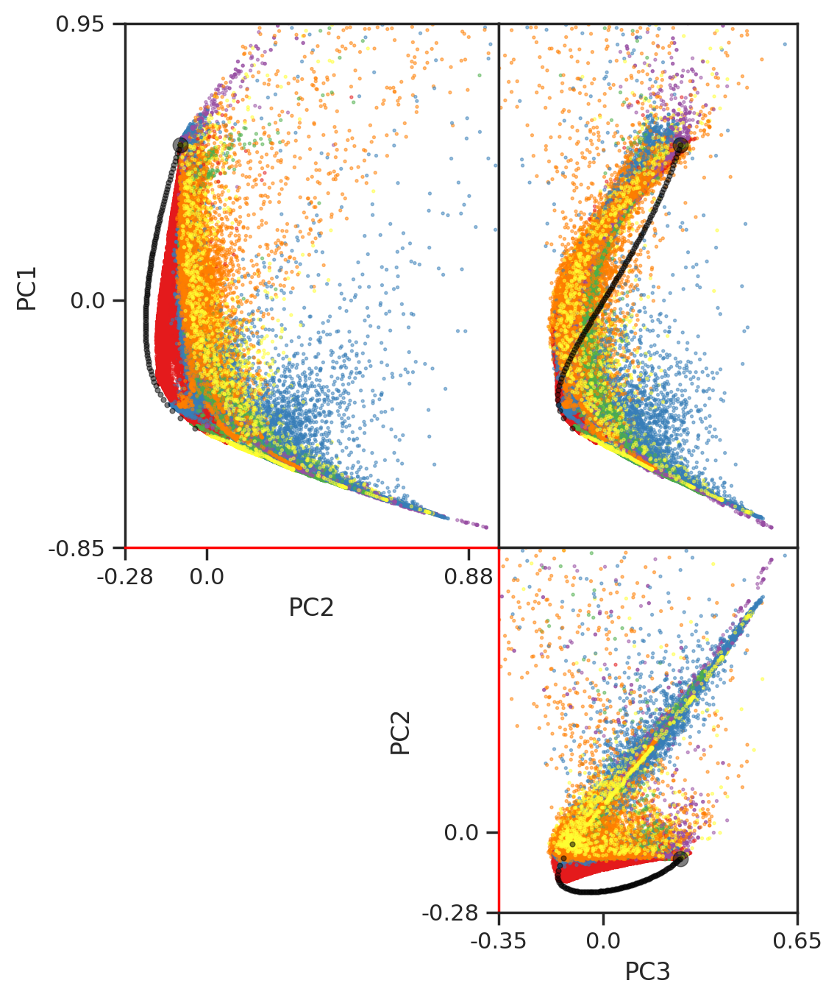

In [4]:
# PC 1-3, colored by model architecture

centers= [0.05, 0.35, 0.15]
grid_ratio=[3.6, 2.5, 2]
grid_size=0.25
f, gs = triplot(didx, r, 
                emph={'geodesic': emph, 'p0': emph[:1], 'p*': emph[-1:]},
                empsize={'geodesic': 6, 'p0': 55, 'p*': 55, 'ref': 8}, 
                empcolor={'geodesic': 'black', 'p0': 'black',
                        'p*': 'red', 'ref': 'red'},
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                ax_label=True,
                ckey='m', cdict=CDICT_M,
                legend=False,
                )

f.savefig(f'{plot_root}/all_models_{fn}_2d.pdf', bbox_inches='tight')
    

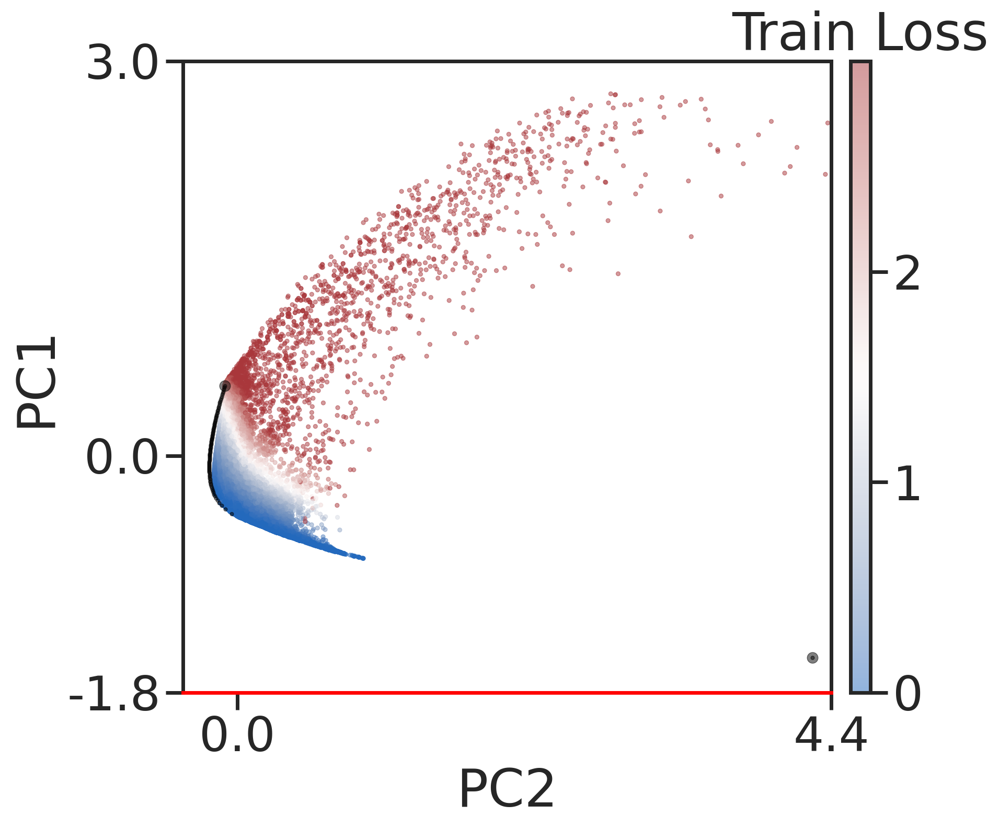

In [28]:
centers=[0.6,2]
grid_ratio=[3, 3]
grid_size=0.8
ckey = 'favg'
f, gs = triplot(didx, r, 
                emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':6, 'p0':55, 'p*':55, 'ref':8}, 
                    empcolor={'geodesic':'black', 'p0':'black', 'p*':'black', 'ref':'red'}, 
                cmin=0, cmax=3,
                ckey=ckey, 
                legend=True, cbar_title='Train Loss',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
            )
f.savefig(f'{plot_root}/all_models_{fn}_2d_ps.pdf', bbox_inches='tight')

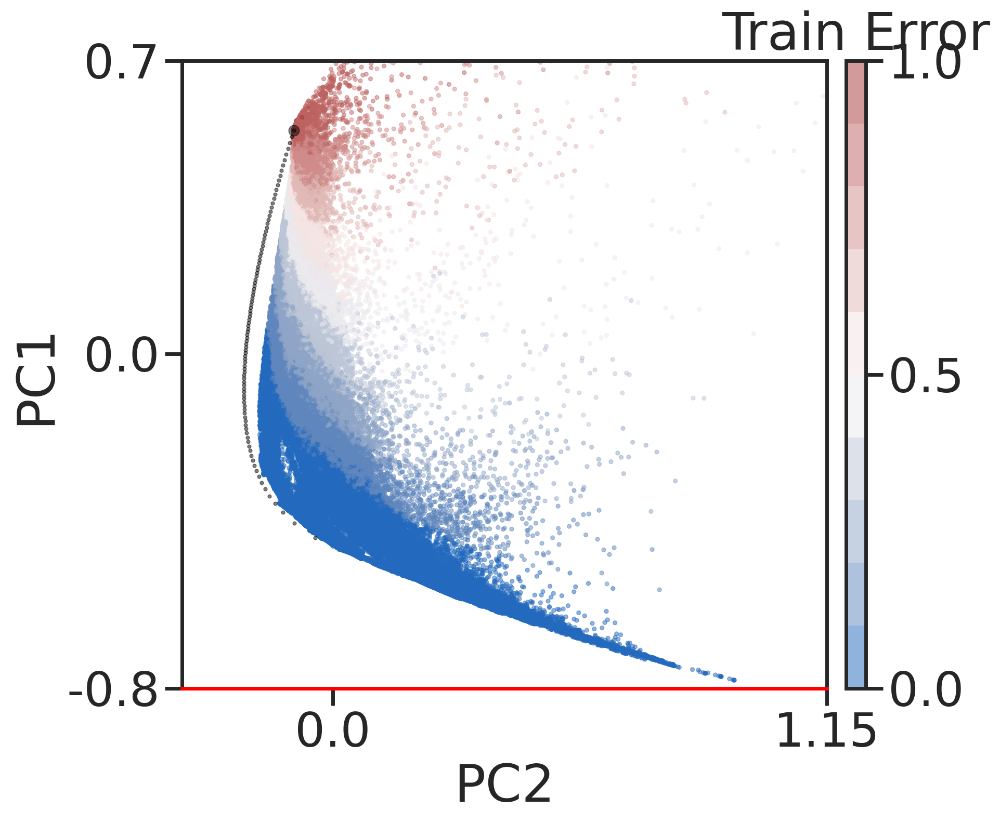

In [26]:

centers= [-0.05, 0.4]
grid_ratio=[3,3]
grid_size=0.25
ckey = 'err'
f, gs = triplot(didx, r, 
                emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                empsize={'geodesic':6, 'p0':55, 'p*':55, 'ref':8}, 
                empcolor={'geodesic':'black', 'p0':'black', 'p*':'black', 'ref':'red'}, 
                cmin=0, cmax=1,
                ckey=ckey,
                discrete_c=True, cbins=10, colorscale='vlag',
                legend=True, cbar_title=f'Train Error',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
            )
f.savefig(f'{plot_root}/all_models_{fn}_error.pdf', bbox_inches='tight')

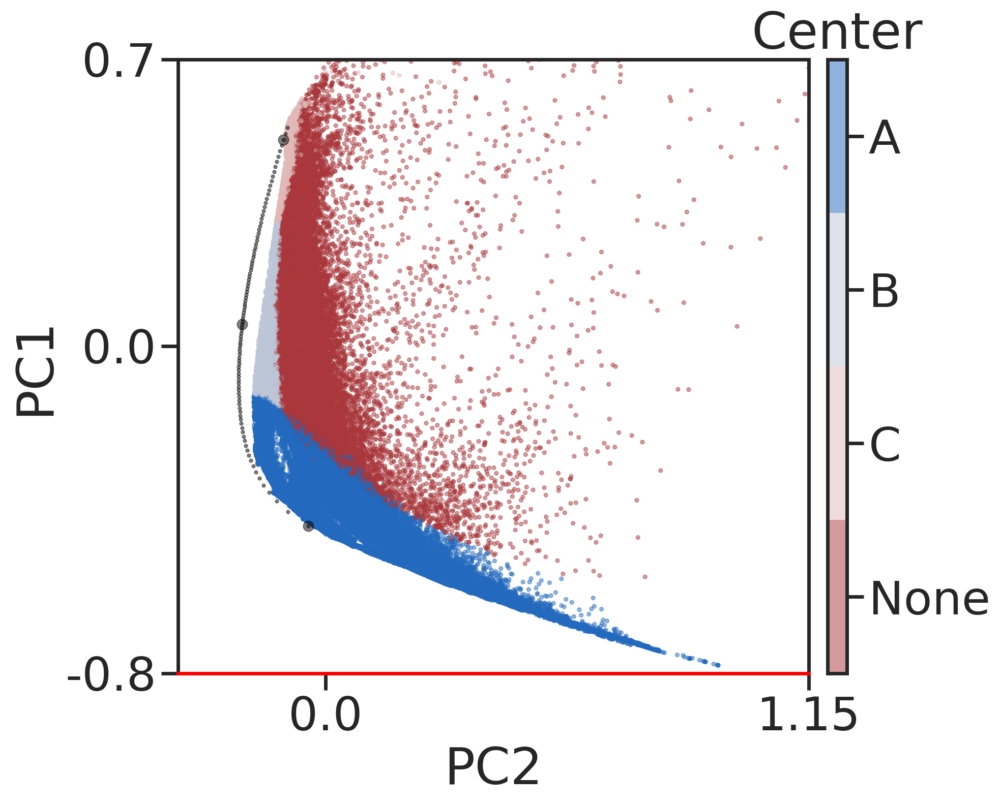

In [36]:
refs = [[151505], [151459], [151409]] # 0.99, 0.51, 0.01 progress on geodesic
radius = 0.15
d2ref = []
with h5py.File(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/w_{key}_all_geod.h5", "r") as f:
    w = f["w"]
    for ri in refs:
        d2ref.append(w[ri, :])
d2ref = np.stack(d2ref).squeeze()
didx['label'] = np.vectorize({'0':'A', '1':'B','2':'C'}.get)(np.argmin(d2ref, axis=0).astype(str))
didx.loc[np.where(d2ref.min(axis=0) > radius)[0], 'label'] = 'None'

centers= [-0.05, 0.4]
grid_ratio=[3,3]
grid_size=0.25
cdict = {l: plt.get_cmap('vlag', 4).colors[::-1][i] for (i,l) in enumerate(['None', 'C', 'B', 'A'])}
f, gs = triplot(didx, r, 
                emph={
                    'geodesic':emph,
                    'ref1': refs[0], 'ref2': refs[1], 'ref3':refs[2],
                },
                empsize={
                    'geodesic':6,  
                    'ref1':55, 'ref2':55 , 'ref3':55
                }, 
                empcolor={
                    'geodesic':'black', 
                    'ref1':'black', 'ref2':'black', 'ref3':'black',
                }, 
                ckey='label', cdict=cdict, 
                legend=True, cbar_title='Center',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
            )
f.savefig(f'{plot_root}/all_models_{fn}_2d_spread.pdf', bbox_inches='tight')

## Test Triplot

In [3]:
key = 'yvh'
fn = 'test'

r = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/r_{key}_all_geod.p")
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all_progress.p')
emph = list(didx[didx.m == 'geodesic'].index)

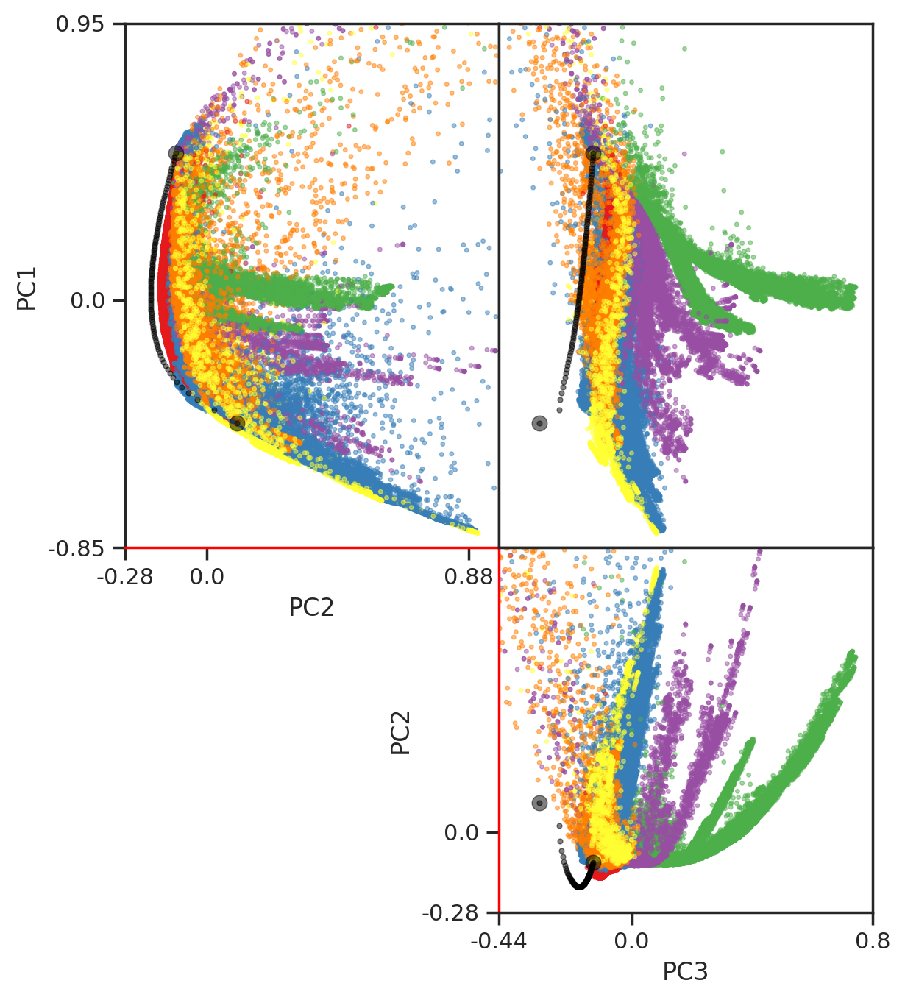

In [42]:
# PC 1-3, colored by model architecture
centers= [0.05, 0.35, 0.18]
grid_ratio=[3.6, 2.5, 2.5]
grid_size=0.25
flip_dims=[0, 2]

f, gs = triplot(didx, r, 
                emph={'geodesic': emph, 'p0': emph[:1], 'p*': emph[-1:]},
                empsize={'geodesic': 6, 'p0': 55, 'p*': 55, 'ref': 8}, 
                empcolor={'geodesic': 'black', 'p0': 'black',
                        'p*': 'black', },
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                ax_label=True,
                ckey='m', cdict=CDICT_M,
                legend=False,
                flip_dims=flip_dims
                )
f.savefig(f'{plot_root}/all_models_{fn}_2d.pdf', bbox_inches='tight')

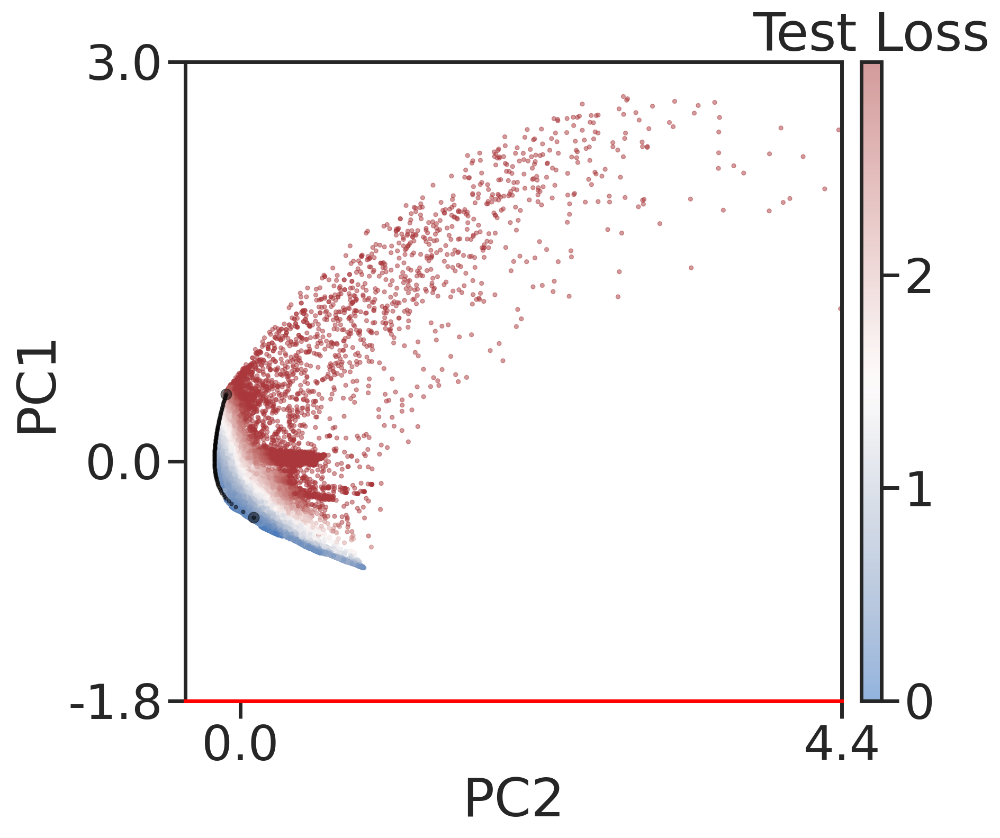

In [49]:
centers=[0.6,2]
grid_ratio=[3, 3]
grid_size=0.8
flip_dims=[0, 2]
ckey = 'vfavg'
f, gs = triplot(didx, r, 
                emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':6, 'p0':55, 'p*':55, 'ref':8}, 
                    empcolor={'geodesic':'black', 'p0':'black', 'p*':'black', 'ref':'red'}, 
                cmin=0, cmax=3,
                ckey=ckey, 
                legend=True, cbar_title='Test Loss',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                flip_dims=flip_dims
            )
f.savefig(f'{plot_root}/all_models_{fn}_2d_ps.pdf', bbox_inches='tight')

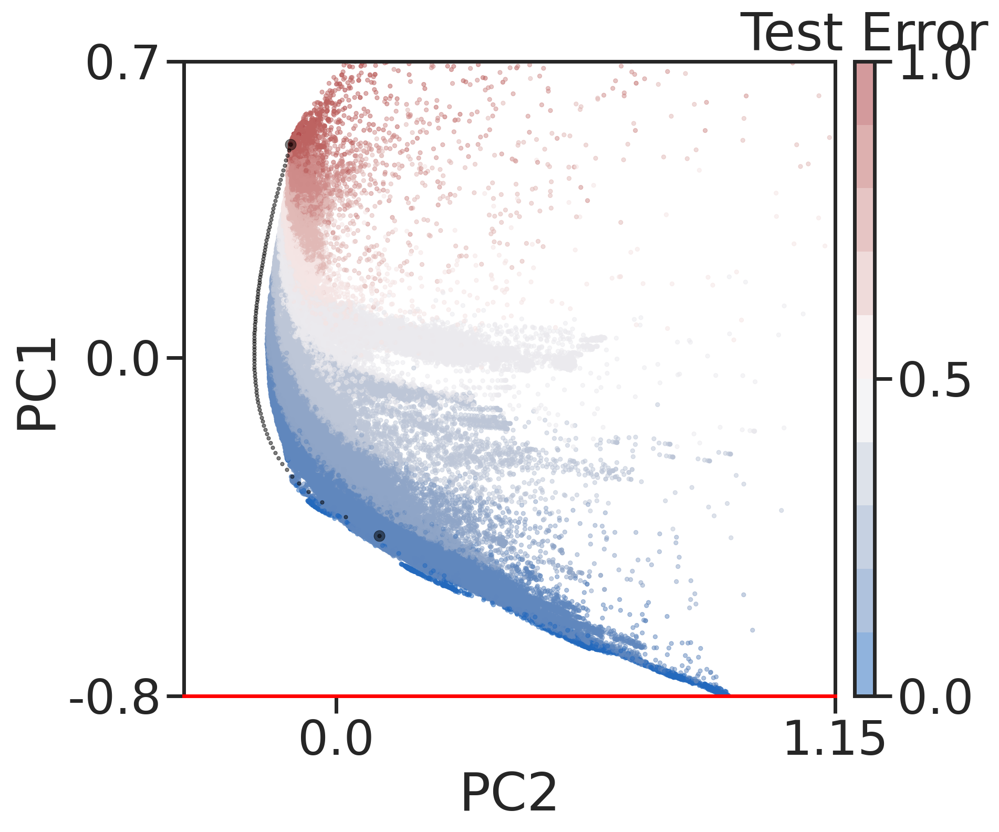

In [80]:
centers= [-0.05, 0.4]
grid_ratio=[3,3]
grid_size=0.25
flip_dims=[0]
ckey = 'verr'
f, gs = triplot(didx, r, 
                emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                empsize={'geodesic':6, 'p0':55, 'p*':55, 'ref':8}, 
                empcolor={'geodesic':'black', 'p0':'black', 'p*':'black', 'ref':'red'}, 
                cmin=0, cmax=1,
                ckey=ckey,
                discrete_c=True, cbins=10, colorscale='vlag',
                legend=True, cbar_title='Test Error',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                flip_dims=flip_dims
            )
f.savefig(f'{plot_root}/all_models_{fn}_2d_error.pdf', bbox_inches='tight')

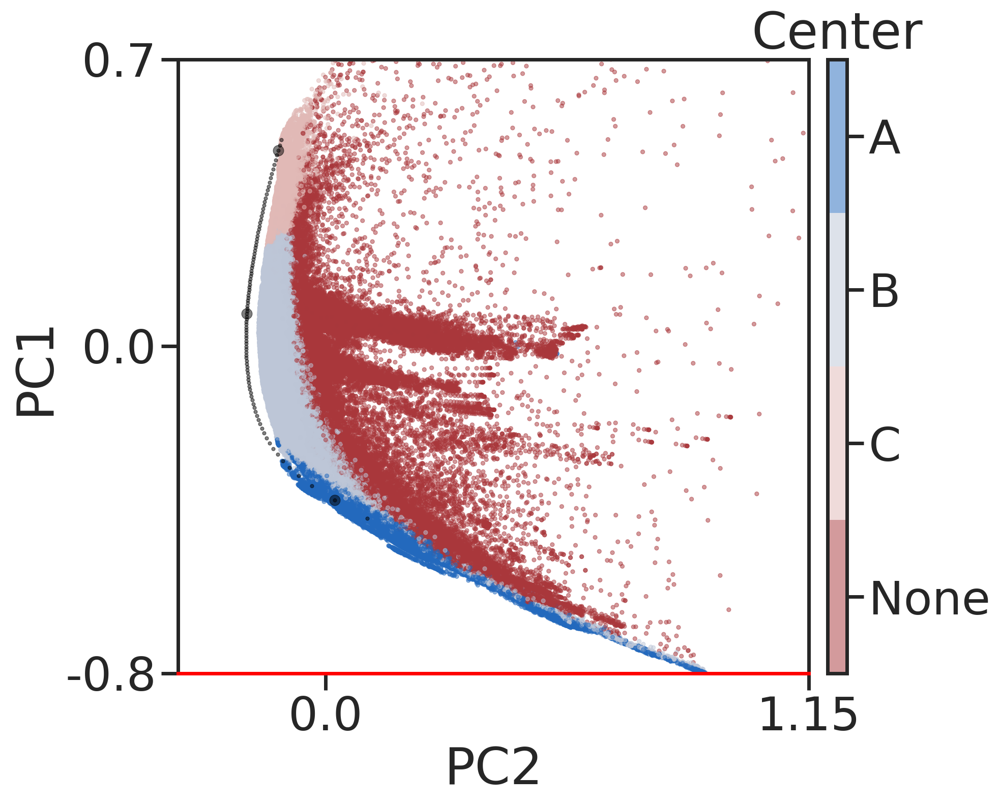

In [53]:
refs = [[151505], [151459], [151409]] # 0.99, 0.51, 0.01 progress on geodesic
radius = 0.3
d2ref = []
with h5py.File(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/w_{key}_all_geod.h5", "r") as f:
    w = f["w"]
    for ri in refs:
        d2ref.append(w[ri, :])
d2ref = np.stack(d2ref).squeeze()
# didx['label'] = np.argmin(d2ref, axis=0).astype(str)
didx['label'] = np.vectorize({'0':'A', '1':'B','2':'C'}.get)(np.argmin(d2ref, axis=0).astype(str))
didx.loc[np.where(d2ref.min(axis=0) > radius)[0], 'label'] = 'None'

centers= [-0.05, 0.4]
grid_ratio=[3,3]
grid_size=0.25
flip_dims=[0]
cdict = {l: plt.get_cmap('vlag', 4).colors[::-1][i] for (i,l) in enumerate(['None', 'C', 'B', 'A'])}
f, gs = triplot(didx, r, 
                emph={
                    'geodesic':emph,
                    'ref1': refs[0], 'ref2': refs[1], 'ref3':refs[2],
                },
                empsize={
                    'geodesic':6,  
                    'ref1':55, 'ref2':55 , 'ref3':55
                }, 
                empcolor={
                    'geodesic':'black', 
                    'ref1':'black', 'ref2':'black', 'ref3':'black',
                }, 
                ckey='label', cdict=cdict, 
                legend=True, cbar_title='Center',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                flip_dims=flip_dims
            )
f.savefig(f'{plot_root}/all_models_{fn}_2d_spread.pdf', bbox_inches='tight')

In [ ]:
refs = [128999, 42148, 87937, 131546, 132762]
radius = 0.5
d2ref = []
with h5py.File(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/w_{key}_all_geod.h5", "r") as f:
    w = f["w"]
    for ri in refs:
        d2ref.append(w[ri, :])
d2ref = np.stack(d2ref)
# didx['label'] = np.argmin(d2ref, axis=0).astype(str)
label_map = {'0':'A', '1':'B','2':'C','3':'D','4':'E'}
didx['label'] = np.vectorize(label_map.get)(np.argmin(d2ref, axis=0).astype(str))
didx.loc[np.where(d2ref.min(axis=0) > radius)[0], 'label'] = 'None'
for i in range(len(refs)):
    iid = list(didx[didx.label==str(i)].index)
    didx.loc[iid, 'd2ref'] = d2ref[i, iid]

# centers= [0.05, 0.35]
# grid_ratio=[3.6, 2.5]
centers= [0.38, 0.2]
grid_ratio=[2.5,2.5]
grid_size=0.25


flip_dims=[2]

emph_all = {f'ref{i}':[ r] for (i, r) in enumerate(refs)}
emp_sizes = {f'ref{i}': 55 for i in range(len(refs))}
emp_color = {f'ref{i}': 'black' for i in range(len(refs))}
emph_all.update({'geodesic':emph})
emp_sizes.update({'geodesic':6})
emp_color.update({'geodesic':'black'})

cdict = {l: plt.get_cmap('vlag', 6).colors[::-1][i] for (i,l) in enumerate(['None'] + list(label_map.values())[::-1])}
f, gs = triplot(didx, r, dims=[1,2],
                emph=emph_all,
                empsize=emp_sizes, 
                empcolor=emp_color, 
                ckey='label', cdict=cdict, 
                legend=True, cbar_title='Center',
                grid_ratio=grid_ratio, grid_size=grid_size, centers=centers,
                flip_dims=flip_dims
            )
# f.savefig(f'{plot_root}/all_models_{fn}_2d_branches.pdf', bbox_inches='tight')

## Count of outliers

In [102]:
key = 'yh'
fn = 'all_geod'
r = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/r_{key}_{fn}.p")
didx = th.load(
    '/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all_progress.p').reset_index(drop=True)

# d_out = didx[didx.favg >= 5].reset_index()
d_out = didx[didx.d2truth_yh >= 2].reset_index()

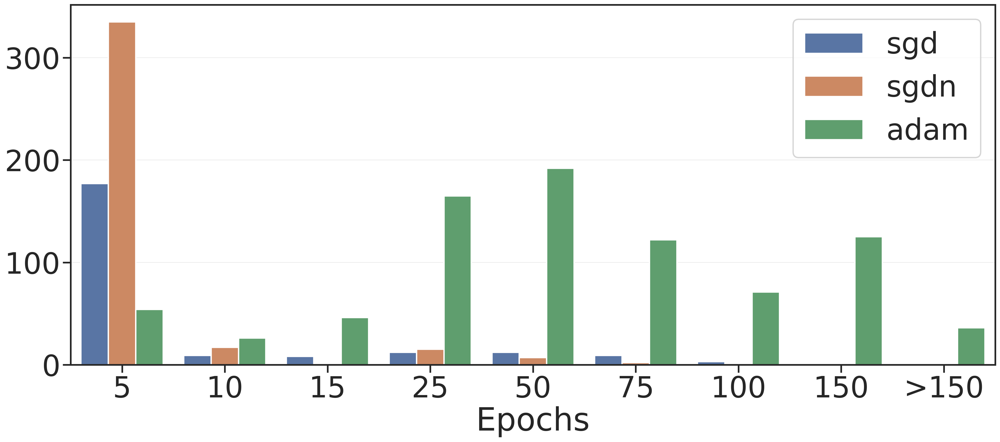

In [106]:
# outliers by nepochs
bins = np.array([0, 5, 10, 15, 25, 50, 75, 100, 150])
ind = np.digitize(d_out['nepochs'], bins)
d_out['nepochs_binned'] = bins[ind-1]

f = plt.figure(figsize=(25, 10))
ax = sns.countplot(data=d_out, x='nepochs_binned', hue='opt')
ax.legend(loc='upper right')
# ax.set(ylabel='# of models with $d_B(P, P_*)>2$')
ax.set(ylabel='')
ax.set(xlabel='Epochs')
new_ticks = [i.get_text() for i in ax.get_xticklabels()]
new_ticks = new_ticks[1:] +['>150']
# ['-'.join(new_ticks[i:i+2])
#              for i in range(len(new_ticks)-1)] + ['>150']
ticks = ax.set_xticks(np.arange(0, len(new_ticks)), new_ticks)
ticks = ax.set_yticks(np.arange(0, 350, 100))
f.savefig(f'{plot_root}/all_models_train_by_nepochs.pdf', bbox_inches='tight')

In [103]:
d_out.m = d_out.m.map({'convmixer':'ConvMixer', 'fc':'Fully\nConnected', 'vit':'ViT', 'wr-10-4-8':'Small\nResNet', 'wr-16-4-64':'Large\nResNet', 'allcnn':'AllCNN'})

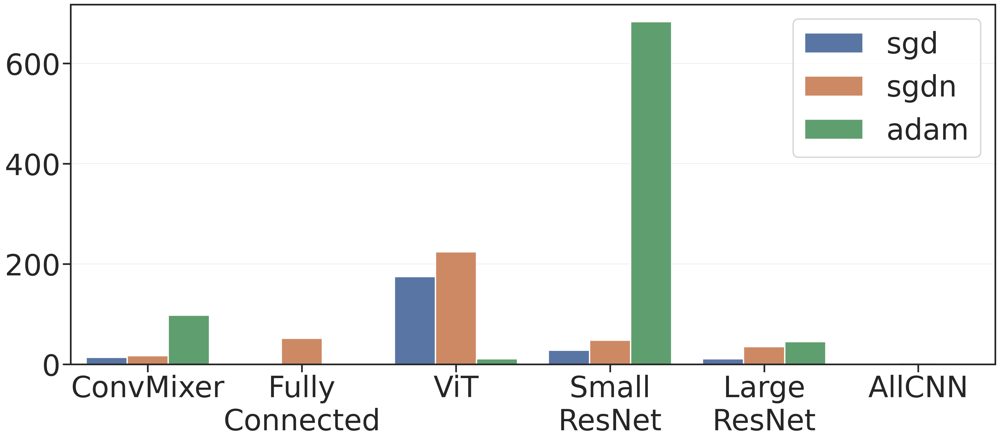

In [108]:
# outliers by model architecture
f = plt.figure(figsize=(25, 10))
ax = sns.countplot(data=d_out, x='m', hue='opt')
ax.legend(loc='upper right')
# ax.set(ylabel='# of models with $d_B(P, P_*)>2$')
ax.set(xlabel='', ylabel='')
f.savefig(f'{plot_root}/all_models_train_by_model.pdf', bbox_inches='tight')

## Dendrograms

In [116]:
key = 'yh'
t = 100

dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p')
didx = th.load(
    f'{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p').reset_index(drop=True)

# Exclude avg models
non_avg = get_idx(didx, "seed >= 0")
didx = didx.iloc[non_avg].reset_index(drop=True)
dists = dists[:, :, non_avg][:, non_avg, :]

# Exclude models that did not train
idxs = didx[didx.err <= 0.1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

# Compute average pairwise distance for each configuration
cols = ['m', 'opt', 'bs', 'lr', 'wd', 'aug']
idx = didx.groupby(cols).indices
pdists = np.zeros([100, len(idx), len(idx)])
keys = list(idx.keys())
for i in range(len(idx)):
    for j in range(i, len(idx)):
        ii = idx[keys[i]]
        jj = idx[keys[j]]
        dij = dists[:, ii, :][:, :, jj]
        pdists[:, i, j] = pdists[:, j, i] = dij.mean(axis=(1, 2))

rows = columns = np.array(keys, dtype="O")

# Accumulate distance w.r.t. time or take snapshot at time t
avg_pdists = pdists[:t, :, :].sum(0)/100
np.fill_diagonal(avg_pdists, 0)
v = squareform(avg_pdists)

# Compute linkage
linkage = sch.linkage(v, method='complete', optimal_ordering=True)
cs = ['-'.join(str(l)) for l in columns.astype(str)]
rs = ['-'.join(str(l)) for l in rows.astype(str)]

ig = np.where(columns[:, 0] == 'geodesic')[0]

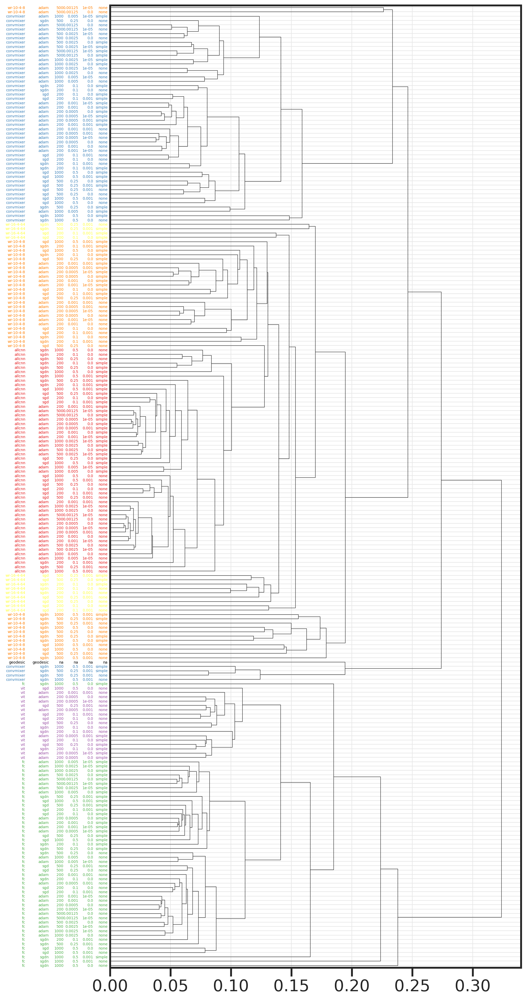

In [117]:
fig, dend = plot_dendrogram(linkage, columns,  didx=didx, key=key, 
                            above_threshold_color='k',
                            cdict=CDICT_M,
                            cols=cols,
                            color_by=0,
                            show_err=False,
                            color_threshold=0)
fig.savefig(f'{plot_root}/{key}_dend_{t}.pdf', bbox_inches='tight')

## Feature Importance

In [11]:
from autogluon.tabular import TabularDataset, TabularPredictor

In [9]:
key = 'yh' 
fn = 'train' 
cols = ['m', 'opt', 'bs', 'lr', 'wd', 'aug']

dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p')
didx = th.load(
    f'{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p').reset_index(drop=True)

# remove avg models
non_avg = get_idx(didx, "seed >= 0")
didx = didx.iloc[non_avg].reset_index(drop=True)
dists = dists[:, :, non_avg][:, non_avg, :]

# remove untrained models
idxs = didx[didx.err <= 0.1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

idx = didx.groupby(cols).indices

# compute average distance between trajectories
pdists = np.zeros([100, len(idx), len(idx)])
keys = list(idx.keys())
for i in range(len(idx)):
    for j in range(i, len(idx)):
        ii = idx[keys[i]]
        jj = idx[keys[j]]
        dij = dists[:, ii, :][:, :, jj]
        pdists[:, i, j] = pdists[:, j, i] = dij.mean(axis=(1, 2))

t = 100
dt = pdists[:t, :, :].sum(0) / 100

dd = pd.DataFrame(np.array(keys, dtype="O"), columns=cols)
dd['d2geod'] = dt[dd[dd.m == 'geodesic'].index[0], :]
dcross = dd.merge(dd, how='cross')
dcross['dcross'] = dt.ravel()

features = ['m', 'opt', 'bs', 'aug', 'wd']
for f in cols:
    dcross[f] = dcross[[f'{f}_x', f'{f}_y']].astype(
        str).apply(' '.join, axis=1)

features = features + ['d2geod_x', 'd2geod_y', 'dcross']
dcross = dcross[features]
agg_fn = {f: 'first' for f in features}
dcross = dcross.groupby(['dcross']).aggregate(
    agg_fn).reset_index(drop=True)

train_data = TabularDataset(dcross)
predictor = TabularPredictor(label='dcross').fit(train_data)
train_importances = predictor.feature_importance(data=train_data)

No path specified. Models will be saved in: "AutogluonModels/ag-20230409_170132/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20230409_170132/"
AutoGluon Version:  0.7.0
Python Version:     3.8.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #73~18.04.1-Ubuntu SMP Mon Mar 14 18:47:48 UTC 2022
Train Data Rows:    24753
Train Data Columns: 7
Label Column: dcross
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.3235615615267552, 3.153085749581806e-08, 0.11972, 0.04092)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available 

[1000]	valid_set's rmse: 0.0029224
[2000]	valid_set's rmse: 0.00236442
[3000]	valid_set's rmse: 0.00209897
[4000]	valid_set's rmse: 0.00192971
[5000]	valid_set's rmse: 0.00180806
[6000]	valid_set's rmse: 0.00171334
[7000]	valid_set's rmse: 0.00165222
[8000]	valid_set's rmse: 0.00159735
[9000]	valid_set's rmse: 0.00155566
[10000]	valid_set's rmse: 0.0015244


	-0.0015	 = Validation score   (-root_mean_squared_error)
	16.42s	 = Training   runtime
	0.41s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 0.00214349
[2000]	valid_set's rmse: 0.0016854
[3000]	valid_set's rmse: 0.00150668
[4000]	valid_set's rmse: 0.00141715
[5000]	valid_set's rmse: 0.00136074
[6000]	valid_set's rmse: 0.00132228
[7000]	valid_set's rmse: 0.0012939
[8000]	valid_set's rmse: 0.00127148
[9000]	valid_set's rmse: 0.00125714
[10000]	valid_set's rmse: 0.00124323


	-0.0012	 = Validation score   (-root_mean_squared_error)
	13.09s	 = Training   runtime
	0.29s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-0.0035	 = Validation score   (-root_mean_squared_error)
	0.94s	 = Training   runtime
	0.08s	 = Validation runtime
Fitting model: CatBoost ...
	-0.0019	 = Validation score   (-root_mean_squared_error)
	115.88s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesMSE ...
	-0.0038	 = Validation score   (-root_mean_squared_error)
	0.71s	 = Training   runtime
	0.09s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-0.003	 = Validation score   (-root_mean_squared_error)
	19.72s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: XGBoost ...
	-0.0024	 = Validation score   (-root_mean_squared_error)
	2.11s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-0.0046	 = Validation score   (-root_mean_squared_error)
	33.98s	 = Training   runtime
	0.01s	 = Validation 

[1000]	valid_set's rmse: 0.00179196
[2000]	valid_set's rmse: 0.00156573
[3000]	valid_set's rmse: 0.00148899
[4000]	valid_set's rmse: 0.00145527
[5000]	valid_set's rmse: 0.00143574
[6000]	valid_set's rmse: 0.00142388
[7000]	valid_set's rmse: 0.00141661
[8000]	valid_set's rmse: 0.00141114
[9000]	valid_set's rmse: 0.00140709
[10000]	valid_set's rmse: 0.00140417


	-0.0014	 = Validation score   (-root_mean_squared_error)
	34.2s	 = Training   runtime
	0.38s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	-0.0012	 = Validation score   (-root_mean_squared_error)
	0.22s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 240.88s ... Best model: "WeightedEnsemble_L2"
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20230409_170132/")
Computing feature importance via permutation shuffling for 7 features using 5000 rows with 5 shuffle sets...
	116.91s	= Expected runtime (23.38s per shuffle set)
	98.04s	= Actual runtime (Completed 5 of 5 shuffle sets)


In [10]:
th.save(train_importances, f'data/{fn}_feature_importances.p')

In [16]:
fn = 'test'
train_importances=th.load(f'data/{fn}_feature_importances.p')

In [17]:
train_importances=train_importances.rename({'m': 'Architecture', 'bs': 'Batch Size', 'opt':'Optimizer', 'aug': 'Augmentation', 'wd':'Weight Decay'})

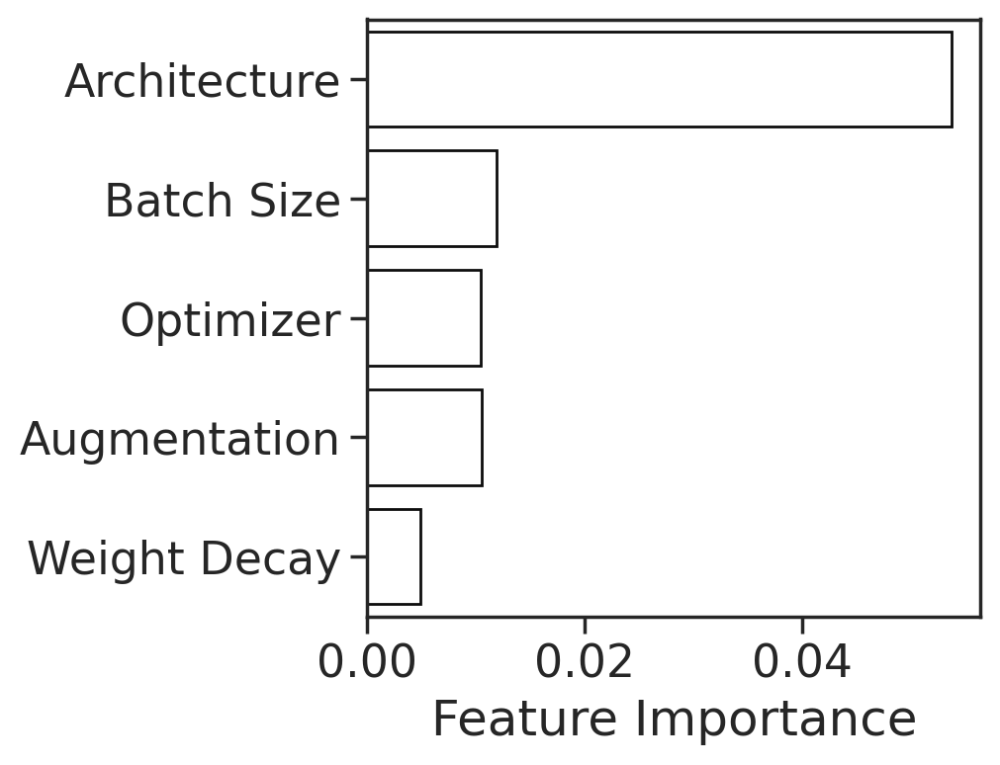

In [18]:
sns.set(context='notebook',
        style='ticks',
        font_scale=1.5)
f, ax = plt.subplots()
sns.barplot(data=train_importances.loc[['Architecture', 'Batch Size', 'Optimizer', 'Augmentation', 'Weight Decay']].reset_index(
), x='importance', y='index', orient='h', ax=ax, color='white',edgecolor="0.05")
ax.set(ylabel='', xlabel='Feature Importance')
f.savefig(f'{plot_root}/{fn}_feature_importance.pdf', bbox_inches='tight')

## Distance to mean trajectory

In [242]:
key = 'yh'
fn = 'train'
cols = ['m', 'opt', 'bs', 'lr', 'wd', 'aug']

dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p')
didx = th.load(
    f'{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p').reset_index(drop=True)

# remove untrained models
idxs = didx[didx.err <= 0.1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

# keep only Euclidean averages 
idxs = didx[didx.seed >=-1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

# get distance to avg model
all_d = pd.DataFrame()
for (c, ii) in didx.groupby(cols).indices.items():
    avg_ii = ii[-1]
    m_ii = ii[:-1]
    d2avg = dists[:, m_ii, avg_ii]
    df = pd.DataFrame(d2avg)
    df['t'] = list(np.linspace(0, 1, 100))
    df = df.melt(id_vars='t')
    df['config'] = [tuple(c) for i in range(len(df))]
    all_d = pd.concat([all_d, df])

for (i, c) in enumerate(cols):
    all_d[c] = np.stack(all_d.config)[:, i]

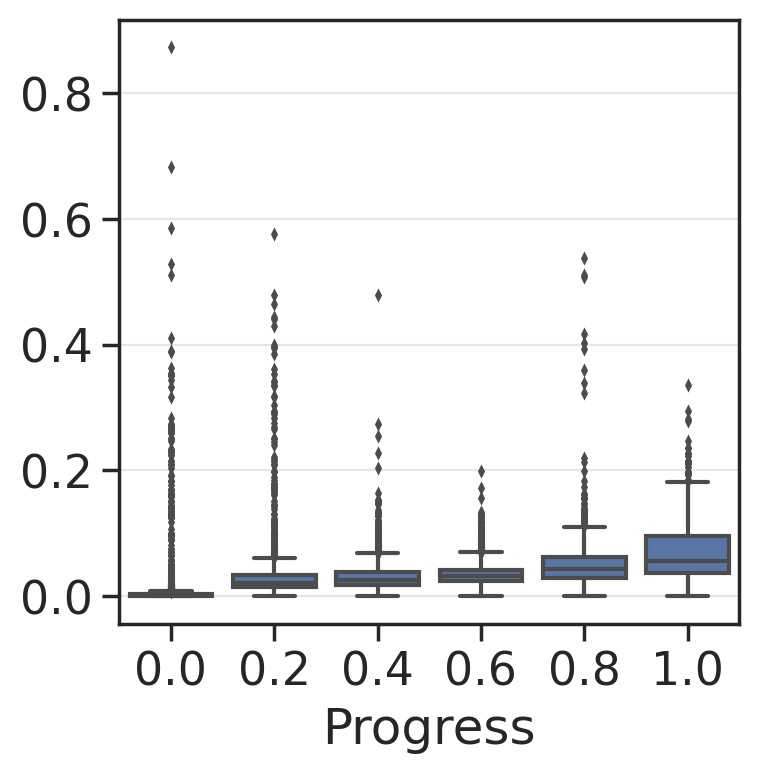

In [193]:
# Boxplot w.r.t. progress
sns.set(context='notebook',
        style='ticks',
        font_scale=1.5,
        rc={'axes.grid': True,
            'grid.color': '.9',
#             'lines.linewidth': 0.5,
            'grid.linewidth': 0.75})
nticks = 5
step = (100 // nticks)-1
f, ax = plt.subplots()
ax = sns.boxplot(data=all_d[all_d.t.isin(all_d.t.unique()[
                ::step])].reset_index(), x='t', y='value', color='b', fliersize=2)
# ax.set(ylabel='Distance to mean trajectory')
ax.set(xlabel='Progress', ylabel='')
# ax.set(ylim=(-0.1,1))
ticks = [i.get_text() for i in ax.get_xticklabels()]
ticks = ax.set_xticks(np.arange(0, len(ticks)),
                    all_d.t.unique()[::step].round(1))

In [194]:
f.savefig(f'{plot_root}/all_models_{fn}_tube_width.pdf', bbox_inches='tight')

[Text(0, 0.5, ''), Text(0.5, 0, 'Progress')]

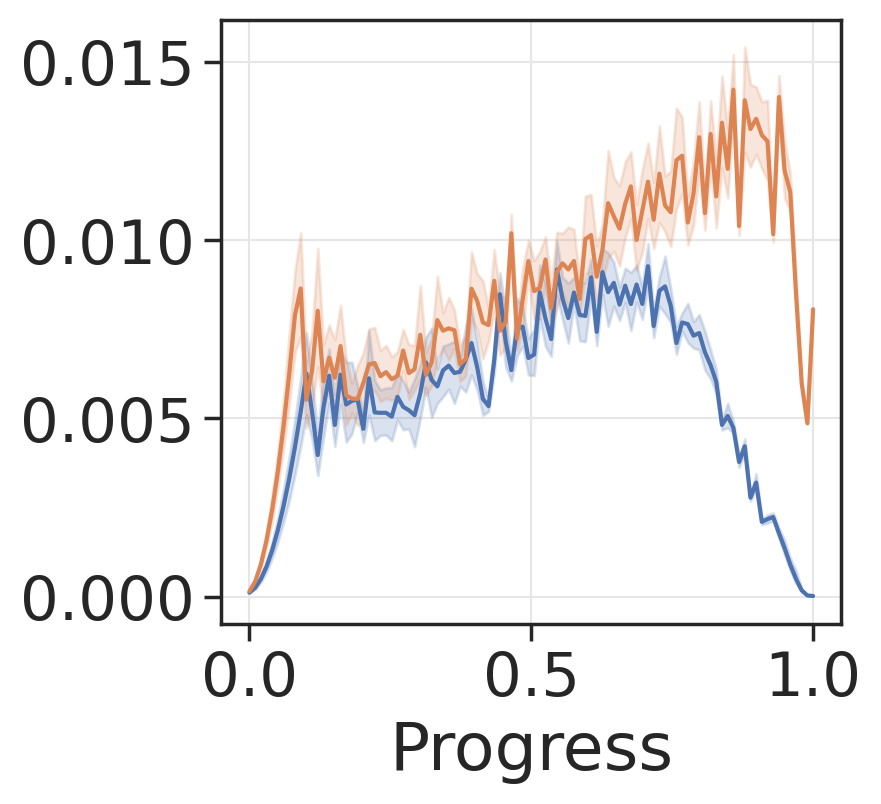

In [250]:
f, ax = plt.subplots()
ax=sns.lineplot(data=all_d.iloc[:2000].reset_index(drop=True), x='t', y='value', hue='aug',legend=False, ax=ax)
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set(ylabel='', xlabel='Progress')


In [251]:
f.savefig(f'{plot_root}/allcnn_train_tube_width_aug.pdf', bbox_inches='tight')

## Distance to geodesic

In [256]:
key = 'yvh' 
fn = 'test' 

dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p')
didx = th.load(
    f'{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p').reset_index(drop=True)

# remove avg models
non_avg = get_idx(didx, "seed >= 0")
didx = didx.iloc[non_avg].reset_index(drop=True)
dists = dists[:, :, non_avg][:, non_avg, :]

# remove untrained models
idxs = didx[didx.err <= 0.1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

# get distance to geodesic
key = 'bs'
choices = [200]

geod_idx = list(didx[didx.m == 'geodesic'].index)

idx = list(didx[didx[key].isin(choices)].index) + geod_idx
d = didx.iloc[idx].reset_index(drop=True)
d = d[d.m != 'geodesic'].reset_index(drop=True)
w = dists[:, :, idx][:, idx, :]
dist2geod = w[:, :-1, -1].T
d['dist_to_geod'] = np.array_split(dist2geod, len(d))
d = d.explode('dist_to_geod').explode('dist_to_geod')
d['t'] = np.tile(np.linspace(0.1, 1, 100), len(dist2geod))

In [257]:
d.m = d.m.map({'convmixer':'ConvMixer', 'fc':'Fully Connected', 'vit':'ViT', 'wr-10-4-8':'Small ResNet', 'wr-16-4-64':'Large ResNet', 'allcnn':'AllCNN'})

In [258]:
cdict = {'convmixer':'ConvMixer', 'fc':'Fully Connected', 'vit':'ViT', 'wr-10-4-8':'Small ResNet', 'wr-16-4-64':'Large ResNet', 'allcnn':'AllCNN'}
cmap={cdict[m]:CDICT_M[m] for m in cdict.keys()}

In [259]:
d = d.rename({'m':'Architecture', 'opt':'Optimizer'}, axis=1)

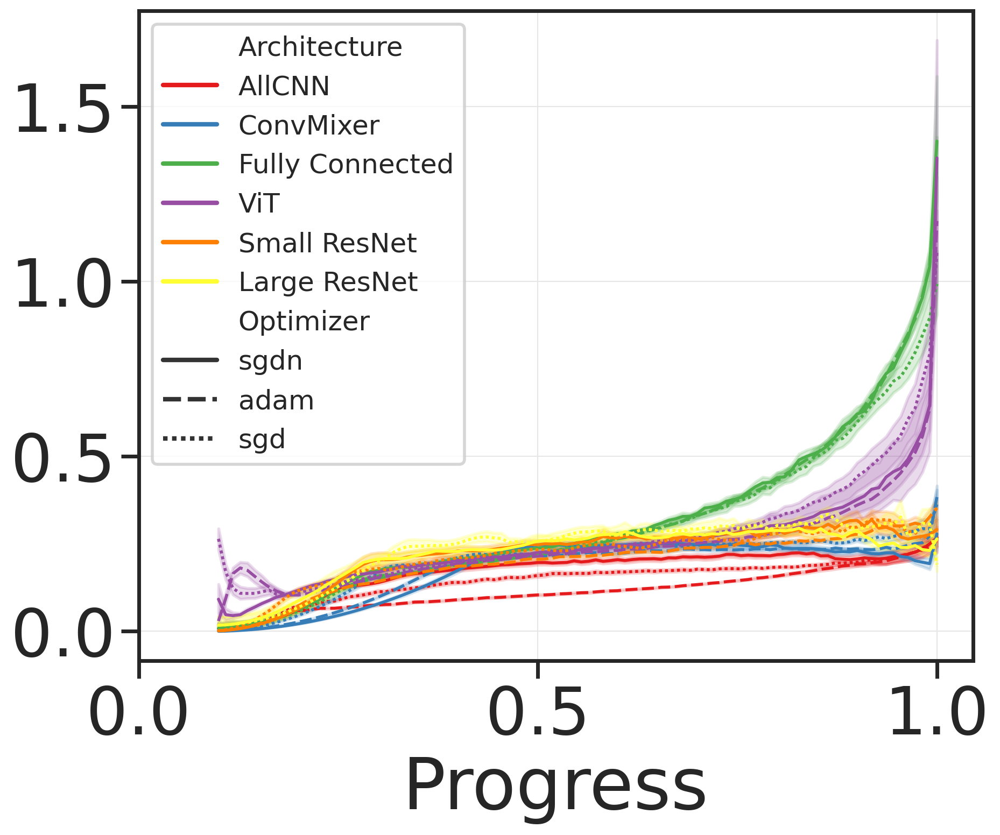

In [264]:
sns.set(context='poster',
        style='ticks',
        font_scale=2,
        rc={'axes.grid': True,
            'grid.color': '.9',
#             'lines.linewidth': 0.5,
            'grid.linewidth': 0.75})
f, ax = plt.subplots(figsize=(10, 8))
ax = sns.lineplot(data=d[d.seed > 0].reset_index(), x='t', 
                  palette=cmap,
                y='dist_to_geod', hue='Architecture', style='Optimizer', lw=2, legend=True)
ax.set(xlabel='Progress', ylabel='', yticks=[0, 0.5, 1, 1.5], xticks=[0, 0.5, 1])
plt.legend(fontsize=18)
# plt.title(f"{key}={choices}")

In [265]:
f.savefig(f'{plot_root}/all_models_test_d2geod.pdf', bbox_inches='tight')

## InPCA of trajectories

In [152]:
key = 'yh'
fn = 'train'
t = 100

dists = th.load(f'{root}/inpca/inpca_results_avg_new/dists_3d_{key}.p')
didx = th.load(
    f'{root}/inpca/inpca_results_avg_new/didx_3d_{key}.p').reset_index(drop=True)

# Exclude avg models
non_avg = get_idx(didx, "seed >= 0")
didx = didx.iloc[non_avg].reset_index(drop=True)
dists = dists[:, :, non_avg][:, non_avg, :]

# Exclude models that did not train
idxs = didx[didx.err <= 0.1].index
didx = didx.iloc[idxs].reset_index(drop=True)
dists = dists[:, :, idxs][:, idxs, :]

w = dists[:t, :, :].sum(0)/100

weight = np.ones(len(w))
weight /= weight.sum()

dmean = (w*weight).sum(1, keepdims=True)
w = w - dmean
w = w - (w*weight[:, None]).sum(0)
w = -0.5*w
r = proj_(w, w.shape[0], 3)

ne = 50
es, vs = sp.eigsh(w, ne, which='LM', return_eigenvectors=True)
r['es'] = es
r['fn'] = np.linalg.norm(w, 'fro')**2

Projecting


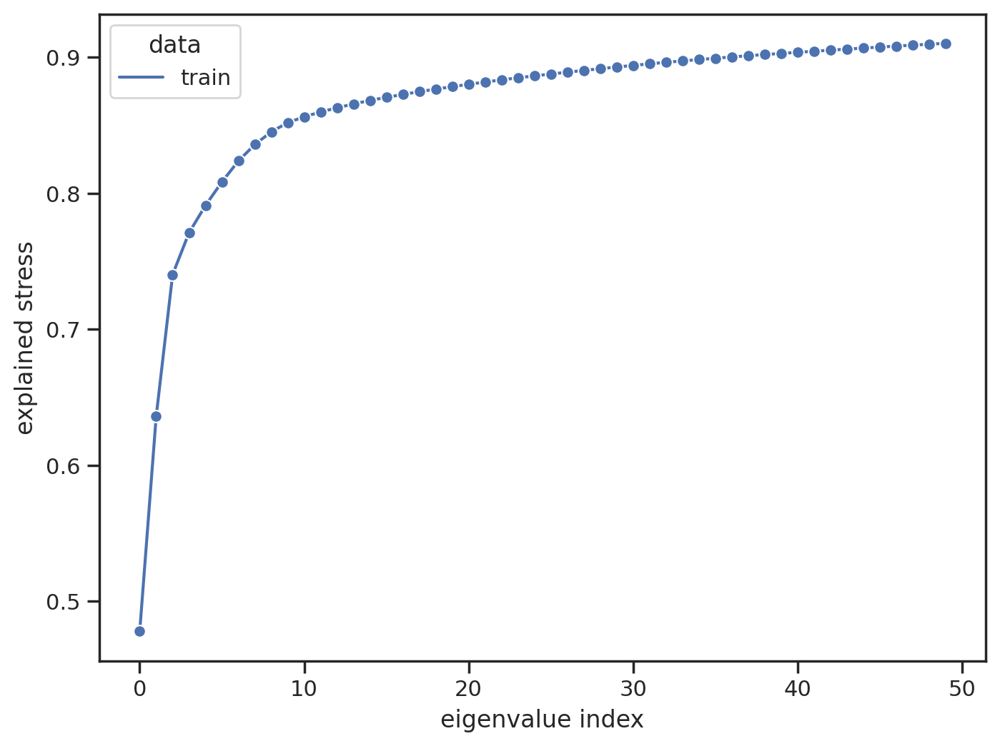

In [153]:
sns.set(context='notebook',
        style='ticks',
        font_scale=1)
df, f = plot_explained_var(r)

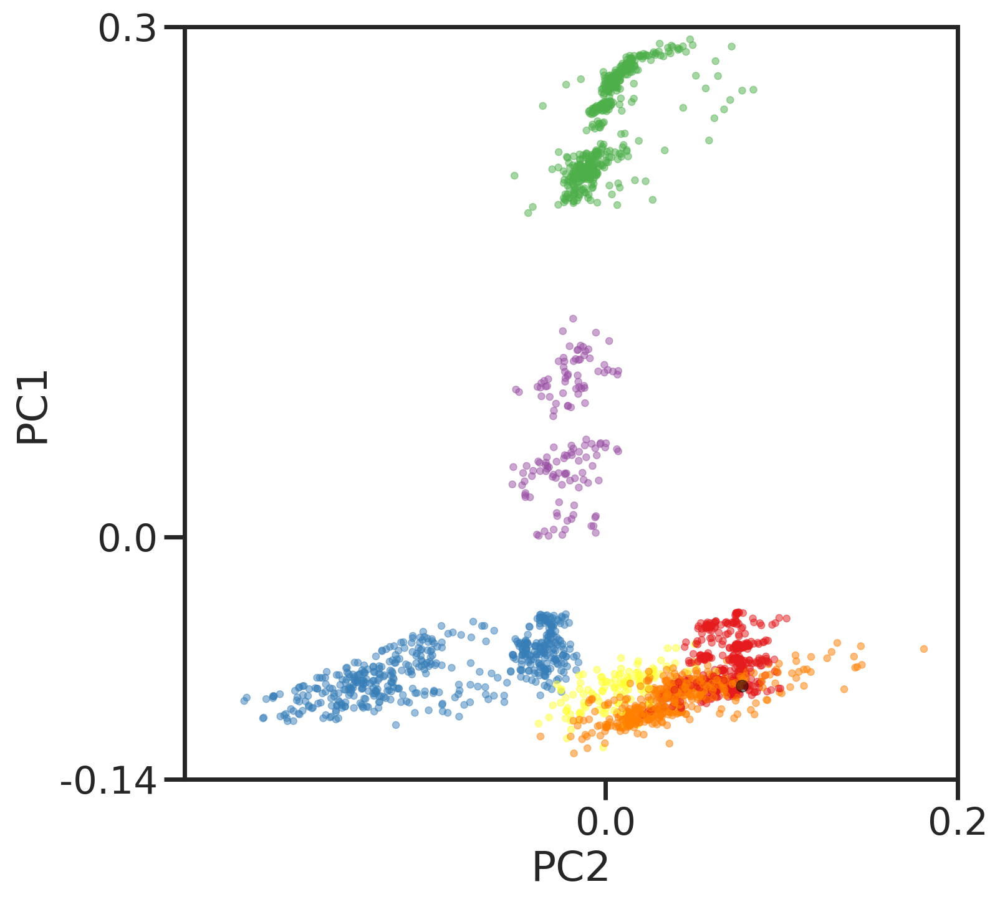

In [150]:
sns.set(context='poster',
        style='ticks',
        font_scale=1)
centers = [0.08, -0.02] 
emph = list(didx[didx.m == 'geodesic'].index)
f, gs = triplot(didx.reset_index(drop=True), r, emph={'geodesic': emph},
                empsize={'geodesic': 48}, cdict=CDICT_M,
                empcolor={'geodesic': 'black'}, d=4,
                ckey='m', colorscale='Set1',
                grid_ratio=[3, 3], grid_size=0.075, centers=centers)
f.savefig(f'{plot_root}/{fn}_trajectories_inpca.pdf', bbox_inches='tight')

## Progress

In [3]:
df = th.load(
    '/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all_progress.p').reset_index(drop=True)

In [ ]:
df['size'] = 10
df.loc[df.m=='allcnn', 'size'] = 2

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
sns.scatterplot(data=df[df.m != 'geodesic'], x='err', legend=False, rasterized=True,
                     y='lam_yh', hue='m',  palette=CDICT_M, markers=True, s=df.size, alpha=0.5, ax=ax)
sns.lineplot(x=np.linspace(0,1,100), y=np.linspace(0,1,100)[::-1], ax=ax, linestyle='--', lw=1)
ax.set(xlabel='Training Error', ylabel='Progress')

[Text(0.5, 0, 'Training Error'), Text(0, 0.5, 'Progress')]

In [5]:
f.savefig(f'{plot_root}/progress_vs_error_train.pdf', bbox_inches='tight')

[Text(0.5, 0, 'Test Error'), Text(0, 0.5, 'Progress')]

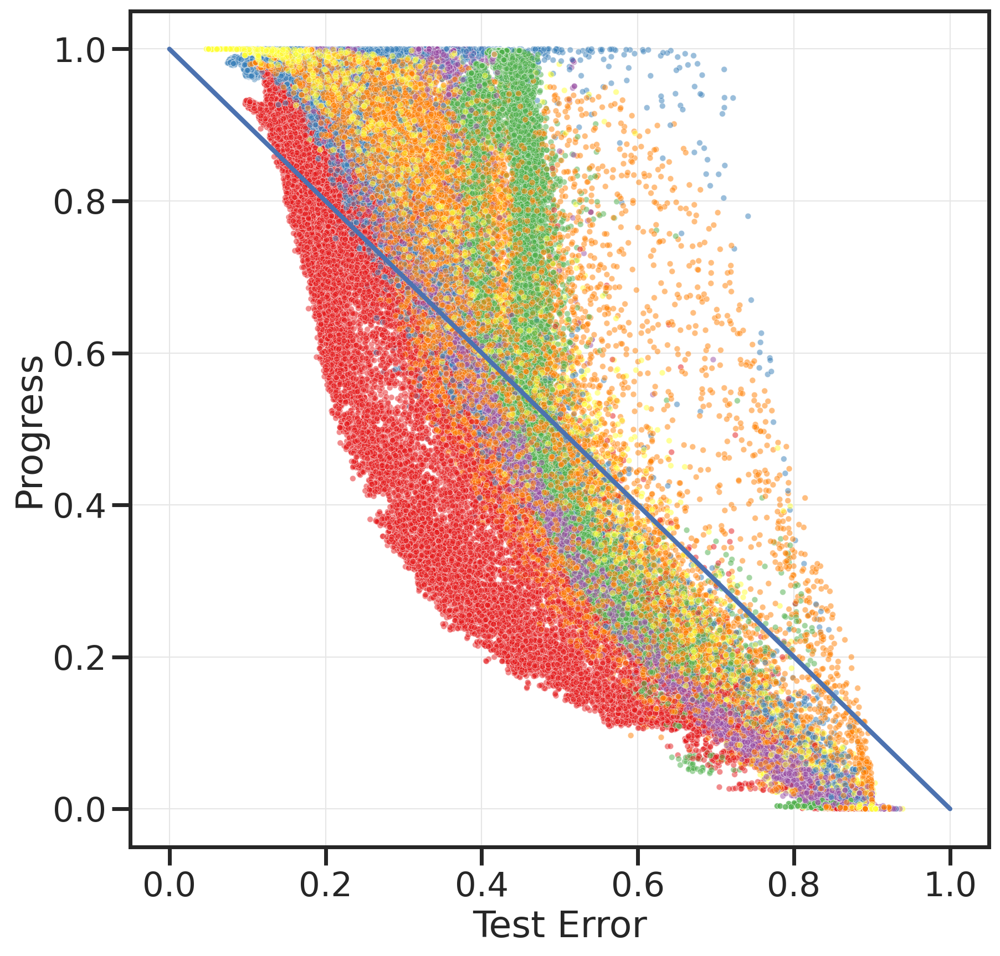

In [7]:
f, ax = plt.subplots(figsize=(10, 10))
sns.scatterplot(data=df[df.m != 'geodesic'], x='verr', legend=False,rasterized=True,
                     y='lam_yvh', hue='m',  palette=CDICT_M, markers=True, s=15, alpha=0.5, ax=ax)
sns.lineplot(x=np.linspace(0,1,100), y=np.linspace(0,1,100)[::-1], ax=ax)
ax.set(xlabel='Test Error', ylabel='Progress')

In [8]:
f.savefig(f'{plot_root}/progress_vs_error_test.pdf', bbox_inches='tight')

In [51]:
df = th.load(
    '/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all_progress.p').reset_index(drop=True)
df = df[(df.m.isin(['wr-10-4-8', 'wr-16-4-64'])) & (df.bs=='200') & (df.end_err < 0.1)].reset_index(drop=True)

In [52]:
cdict = {'wr-10-4-8':'Small ResNet', 'wr-16-4-64':'Large ResNet'}
df.m = df.m.map(cdict)
df = df.rename({'m': 'Architecture', 'opt':'Optimizer'}, axis=1)
cmap={cdict[m]:CDICT_M[m] for m in cdict.keys()}

[Text(0.5, 0, 'Epochs'), Text(0, 0.5, 'Progress'), None]

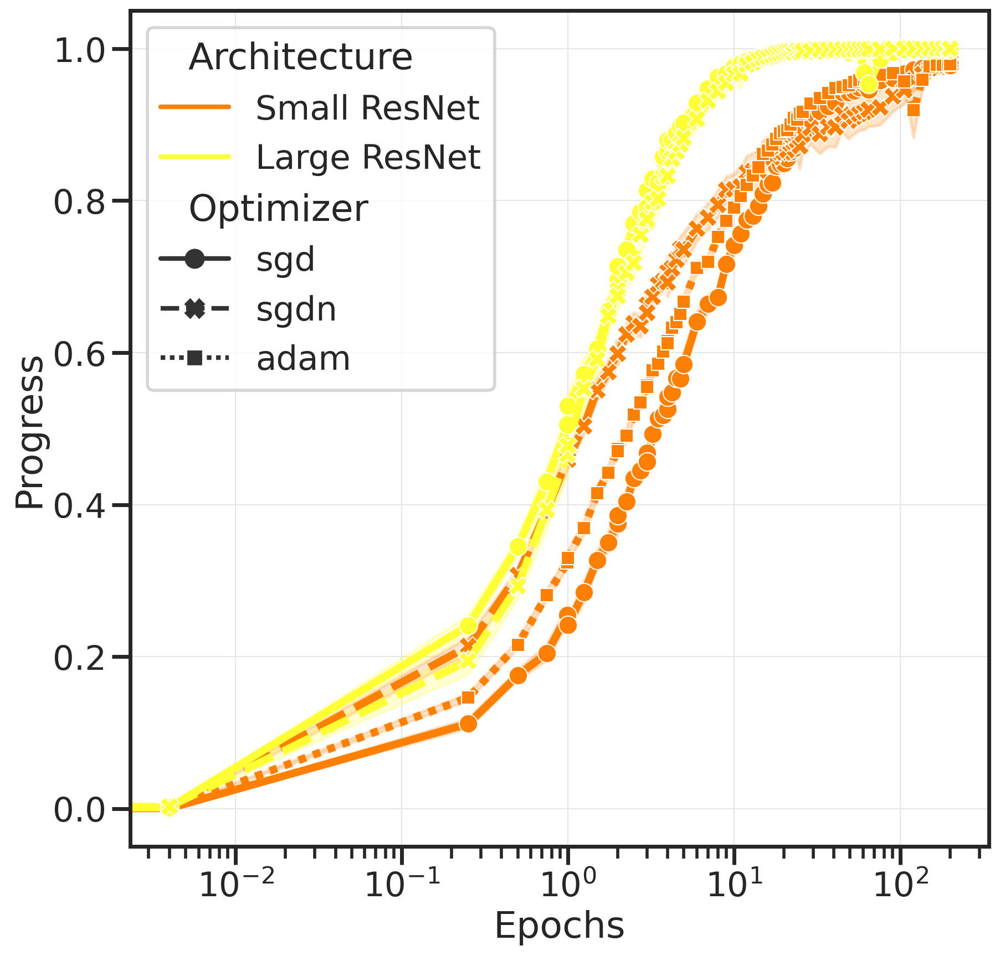

In [53]:
f, ax = plt.subplots(figsize=(10, 10))
sns.lineplot(data=df, x='nepochs', legend=True,
                     y='lam_yh', hue='Architecture',  palette=cmap, markers=True, style='Optimizer', lw=5, ax=ax)
ax.set(xlabel='Epochs', ylabel='Progress', xscale='log')

In [54]:
f.savefig(f'{plot_root}/small_vs_large_wrn_progress.pdf', bbox_inches='tight')